In [5]:
from stimulus import stimulus
from pipeline import meso,reso,experiment

from pipeline.utils import h5,caiman_interface

from commons import lab

import scanreader

import scipy.optimize as opt
import autograd.numpy as np
from autograd import grad

from scipy.interpolate import interp1d

from itertools import product
import matplotlib.pyplot as plt


def plot_dotmap(key,max_time=0.25):
    mon_width = 55.3 # width of monitor in centimeters


    print('populating upstream')
    # uses ScanInfo for correcting sync and fps
    if len(reso.ScanInfo & key) < 1:
        reso.ScanInfo.populate(key)
    # uses Sync to align scan to frames
    if len(stimulus.Sync & key) < 1:
        stimulus.Sync.populate(key)

    print('fetching scan') # fetches scan and averages 
    scan_filenames = (experiment.Scan & key).local_filenames_as_wildcard
    scan = scanreader.read_scan(scan_filenames) # for mesoscope, returns (fields x pixel_height x pixel_width x channel x frame) matrix, vertically concatenating all scan fields in the same plane
    av_scan = np.average(scan,(0,1,2,3)) # average across all depths, pixels, and channels per frame

    dot_rel = ((stimulus.Trial & key) * stimulus.SingleDot)

    xs,xsizes,ys,ysizes = dot_rel.fetch('dot_x','dot_xsize','dot_y','dot_ysize')

    x_set = sorted(list(set(xs))) #ordered set of x dot coordinates (low to high = left to right)
    y_set = sorted(list(set(ys))) #ordered set of y dot coordinates (low to high = top to bottom)
    x_num,y_num = len(x_set),len(y_set)
    x_mat,y_mat = np.meshgrid(x_set,y_set)

    xsize = list(set(xsizes))
    ysize = list(set(ysizes))
    print(xsize)
    assert len(xsize) == 1
    assert len(ysize) == 1
    xsize = xsize[0]
    ysize = ysize[0]


    print('deconvolving scan')
    deconvolved_scan,_ = caiman_interface.deconvolve(av_scan)

    print('syncing trace')
    stim_sync = (stimulus.Sync & key).fetch1('frame_times')
    nfields,fps = (reso.ScanInfo & key).fetch1('nfields','fps')
    s2f = interp1d(stim_sync.squeeze(),np.arange(np.size(stim_sync))/(nfields)) #frame to stimulus clock
    
    print('computing stas')
    stim_stack = []
    for y,x in product(y_set,x_set):
        x_restrict = f'dot_x > {x - 0.01} and dot_x < {x + 0.01}'
        y_restrict = f'dot_y > {y - 0.01} and dot_y < {y + 0.01}'
        flip_times = (dot_rel & x_restrict & y_restrict).fetch('flip_times')
        stim_trace = np.zeros_like(deconvolved_scan)
        for flip_time in flip_times[1:]:
            flip_time = np.round(s2f(flip_time[0])).astype(int)
            stim_trace[flip_time[0]:flip_time[1]] = np.ones(np.diff(flip_time))
        stim_stack.append(stim_trace)
    stim_stack = np.vstack(stim_stack)

    num_lags = int(np.ceil((max_time * fps)/5) * 5)
    num_timepoints = stim_stack.shape[-1] - (num_lags - 1) # length of movie minus lag time
    weighted_sums = [np.tensordot(deconvolved_scan[..., lag:lag + num_timepoints], stim_stack[..., :num_timepoints],
                                  axes=(-1, -1)) for lag in range(num_lags)]
    stas = np.stack(weighted_sums, -1) / num_timepoints # num_traces x height x width x num_lags
    stas = [np.vstack([sta[i:i+len(x_set)] for i in len(x_set) * np.arange(len(y_set))]) for sta in stas.T]



    print('fitting stas')

    def twoD_mat(x_mat,y_mat,p):
        (amplitude,xo,yo,sigma_x,sigma_y,theta,offset) = p
        a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
        b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
        c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
        return offset + amplitude*np.exp( - (a*((x_mat-xo)**2) + 2*b*(x_mat-xo)*(y_mat-yo) + c*((y_mat-yo)**2)))

    sta_fits, fit_params = [],[]
    for sta in stas:
        def twoD_loss(p):
            sta_hat = twoD_mat(x_mat,y_mat,p)
            return np.sum((sta_hat - sta)**2)

        dloss = grad(twoD_loss)

        #initial parameters estimate center peak, baseline, and height, default 0.1 std and 0 rotation
        p0 = (np.max(sta),
              x_set[np.argmax(np.max(sta,0))], 
              y_set[np.argmax(np.max(sta,1))],
              0.1,
              0.1,
              0,
              np.min(sta))

        # linear fit to optimize 2d gaussian fit parameters
        pstar, *_ = opt.fmin_l_bfgs_b(twoD_loss, p0, dloss)

        # add r x c matrix from 2D gaussian fit parameters to stack
        sta_fits.append(twoD_mat(x_mat,y_mat,pstar))
        fit_params.append(pstar)



    print('projecting dots to monitor')
    mon_rel = experiment.DisplayGeometry() & 'animal_id = 18765 and session = 4'
    mon_aspect = float(mon_rel.fetch1('monitor_aspect'))

    y_mat_size = 1000
    x_mat_size = int(y_mat_size * mon_aspect)
    mat = np.full((y_mat_size,x_mat_size),np.nan)

    mon_rel = experiment.DisplayGeometry() & 'animal_id = 18765 and session = 4'
    mon_aspect = float(mon_rel.fetch1('monitor_aspect'))

    y_mat_size = 1000
    x_mat_size = int(y_mat_size * mon_aspect)
    mat = np.full((y_mat_size,x_mat_size),np.nan)

    def dot2mon(dot_images):
        mon_images = []
        for dot_image in dot_images:
            mon_mat = mat.copy()
            for (y,x),resp in zip(product(y_set,x_set), np.hstack(dot_image)):
                xmin = int((np.max((x - xsize/2,-0.5))+0.5)*x_mat_size)
                xmax = int((np.min((x + xsize/2,0.5))+0.5)*x_mat_size)
                ymax = int((np.min((y*mon_aspect + (ysize*mon_aspect)/2,0.5))+0.5)*y_mat_size)
                ymin = int((np.max((y*mon_aspect - (ysize*mon_aspect)/2,-0.5))+0.5)*y_mat_size)
                mon_mat[ymin:ymax,xmin:xmax] = np.full((np.abs(ymax-ymin),np.abs(xmax-xmin)),resp)
            mon_images.append(mon_mat)
        return mon_images

    stas,sta_fits = dot2mon(stas),dot2mon(sta_fits)

    print('plotting dots')


    delay_interval = (1/fps)*1000

    c = 5
    r = (np.ceil(num_lags/c)*2+2).astype(int)
    fig = plt.figure(figsize=(c*3*np.ceil(mon_aspect),r*3))
    gs = plt.GridSpec(r,c)


    sta_max = np.nanmax(np.abs(stas))
    fit_max = np.nanmax(np.abs(sta_fits))

    axes = []
    for sta_mat,fit_mat,fit_param,i in zip(stas,sta_fits,fit_params,np.arange(num_lags)):
        delay = i*delay_interval

        ax = fig.add_subplot(gs[np.floor(i/c).astype(int),i%5])
        ax.matshow(sta_mat,vmin=-sta_max,vmax=sta_max)
        ax.set_xlabel(str(int(delay)) + 'ms to ' + str(int(delay + delay_interval)) + 'ms',fontsize=20)
        axes.append(ax)

        ax = fig.add_subplot(gs[np.floor((num_lags+i)/c).astype(int),i%5])
        ax.matshow(fit_mat,vmin=-fit_max,vmax=fit_max)
        ax.set_xlabel(str(int(delay)) + 'ms to ' + str(int(delay + delay_interval)) + 'ms',fontsize=20)
        ax.set_title(' x:' + str(np.round(fit_param[1] * mon_width,2)) + 
                     ' y:' + str(np.round(fit_param[2] * mon_width,2)) + 
                     ' amp_i:' + str(np.round((fit_param[0]-fit_param[6])/fit_param[0],3)) + '\n' + 
                     'sx:' + str(np.round(fit_param[3] * mon_width,2)) + 
                     ' sy:' + str(np.round(fit_param[4] * mon_width,2)) + 
                     ' theta:' + str(np.round(fit_param[5],2)),fontsize=25)
        axes.append(ax)

    for ax in axes:
        ax.set_aspect('equal')
        ax.set_yticks([])
        ax.set_xticks([])


    axes = []

    ax = fig.add_subplot(gs[-2,:])
    ax.plot(av_scan)
    ax.set_title('ROI average',fontsize=30)
    axes.append(ax)

    ax = fig.add_subplot(gs[-1,:])
    ax.plot(deconvolved_scan)
    ax.set_title('deconvolved ROI average',fontsize=30)
    axes.append(ax)

    for ax in axes:
        trace_length = (np.ceil(len(av_scan)/1000)*1000).astype(int)
        ax.set_xticks(np.linspace(0,trace_length,(trace_length/1000).astype(int)+1))
        ax.set_xlim((0,len(av_scan)))
        ax.set_yticks([])



    fig.subplots_adjust(left=0.05,right=0.95,bottom=0.05,top=0.95,hspace=.8,wspace=.1)
    title = str(key['animal_id']) + '_' + str(key['session']) + '_' + str(key['scan_idx'])
    plt.suptitle(title,fontsize=25)
    plt.savefig(title + '.png')

    plt.show()

In [ ]:
key = {'animal_id':26470,'session':4,'scan_idx':2}
plot_dotmap(key)

populating upstream
Reading header...


In [ ]:
key = {'animal_id':26470,'session':4,'scan_idx':1}
plot_dotmap(key)

In [ ]:
key = {'animal_id':26470,'session':4,'scan_idx':1}
plot_dotmap(key)

In [ ]:
key = {'animal_id':26470,'session':4,'scan_idx':1}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.05]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 5 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


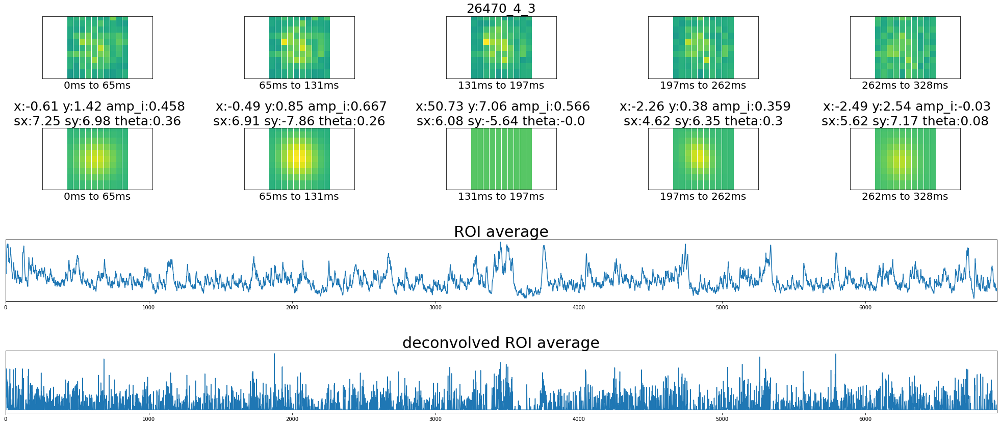

In [6]:
key = {'animal_id':26470,'session':4,'scan_idx':3}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


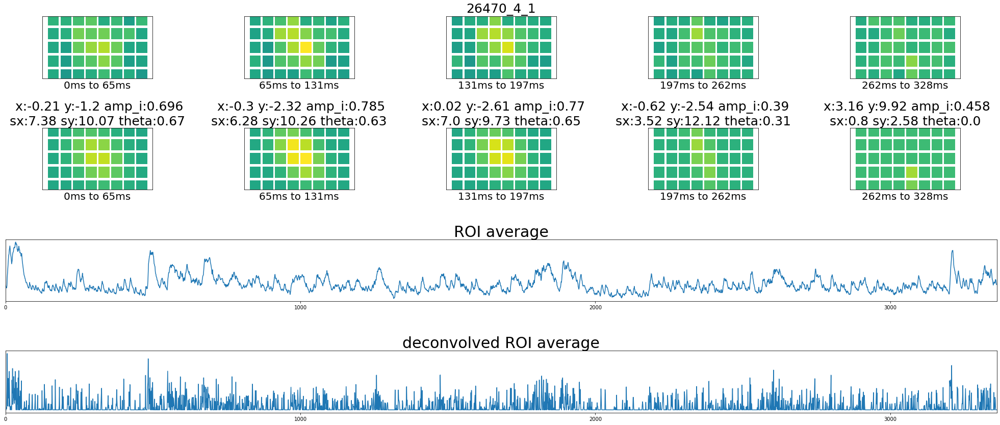

In [3]:
key = {'animal_id':26470,'session':4,'scan_idx':1}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.05]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 9 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


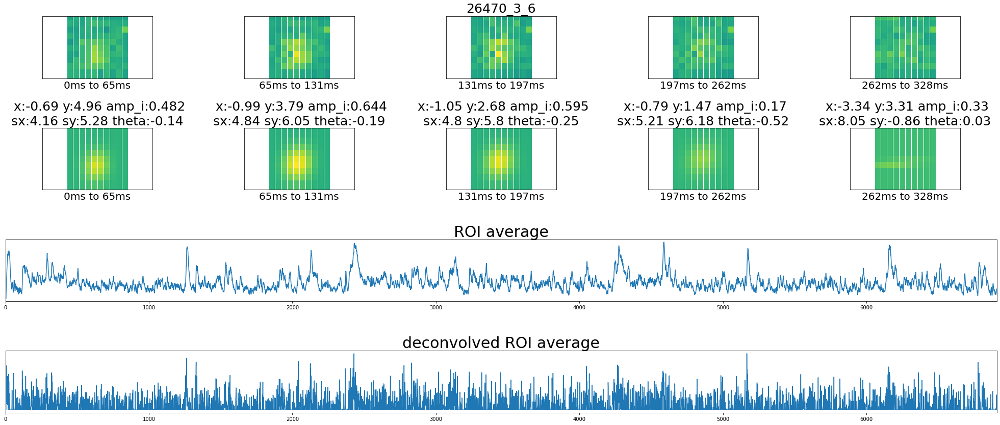

In [7]:
key = {'animal_id':26470,'session':3,'scan_idx':6}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.05]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 7 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


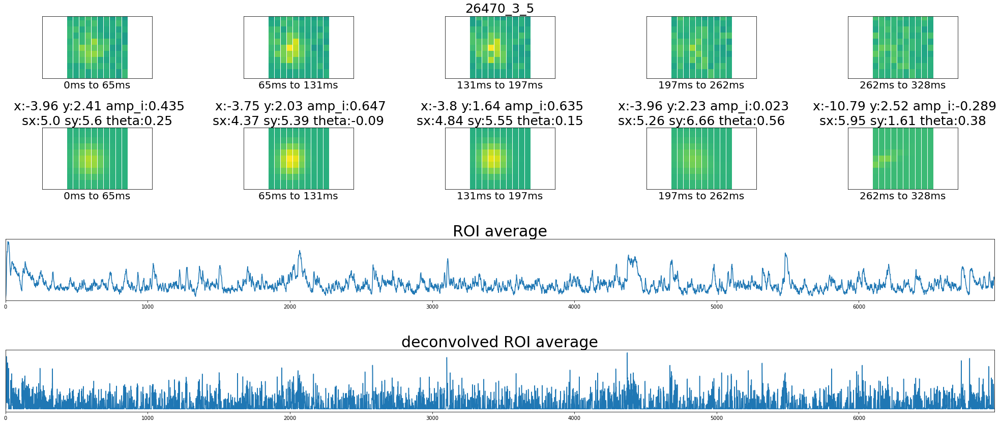

In [6]:
key = {'animal_id':26470,'session':3,'scan_idx':5}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 5 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


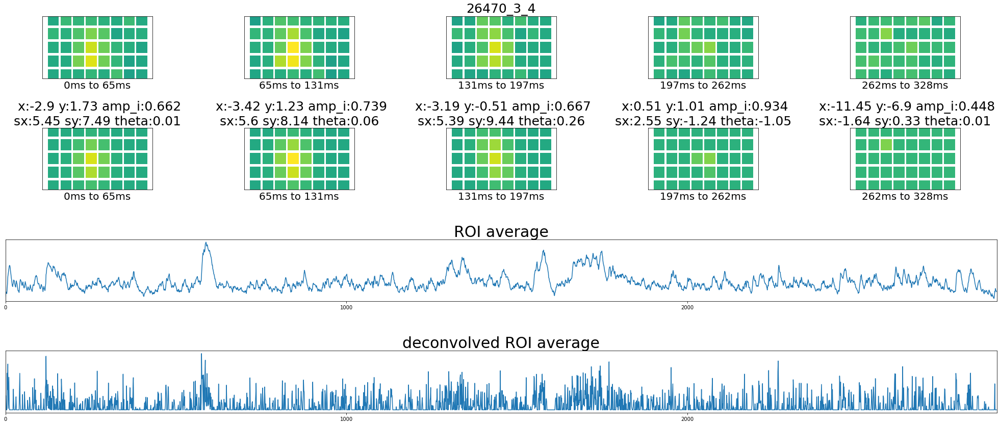

In [5]:
key = {'animal_id':26470,'session':3,'scan_idx':4}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


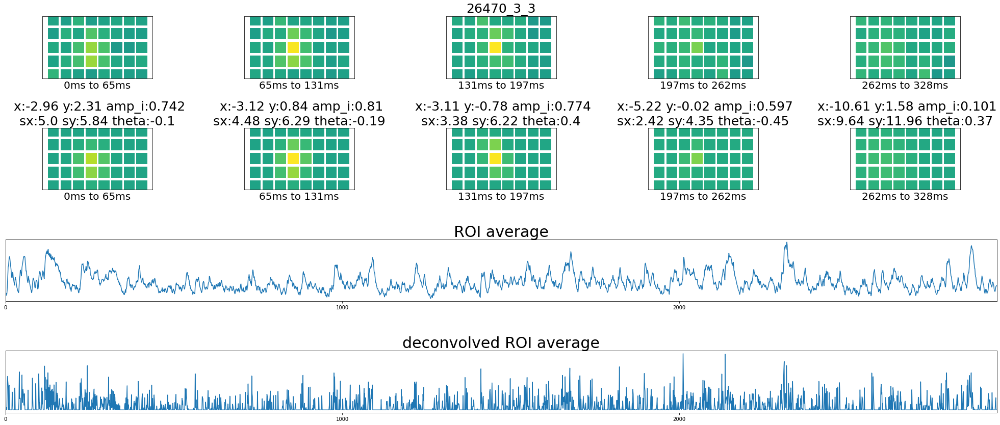

In [4]:
key = {'animal_id':26470,'session':3,'scan_idx':3}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


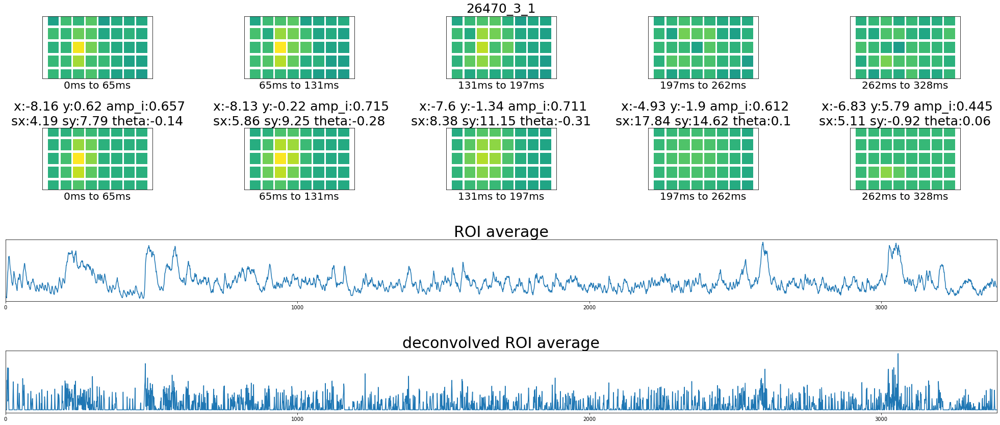

In [3]:
key = {'animal_id':26470,'session':3,'scan_idx':1}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 15 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This u

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


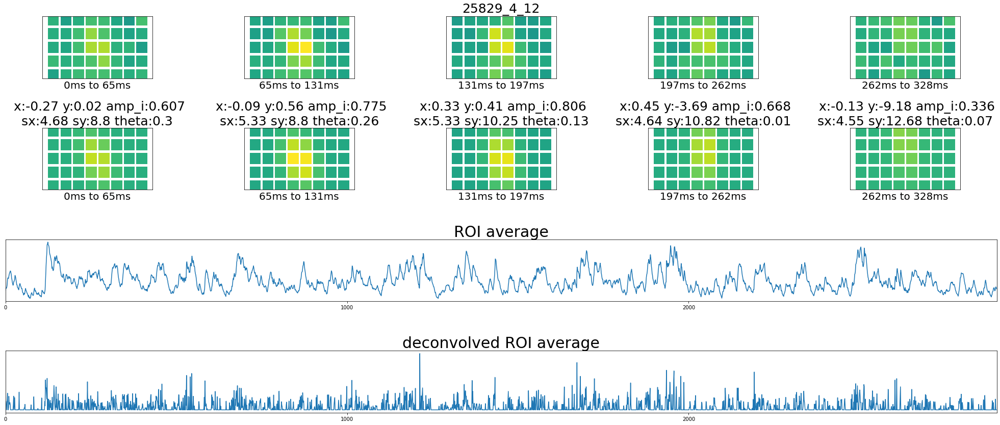

In [10]:
key = {'animal_id':25829,'session':4,'scan_idx':12}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 13 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This u

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


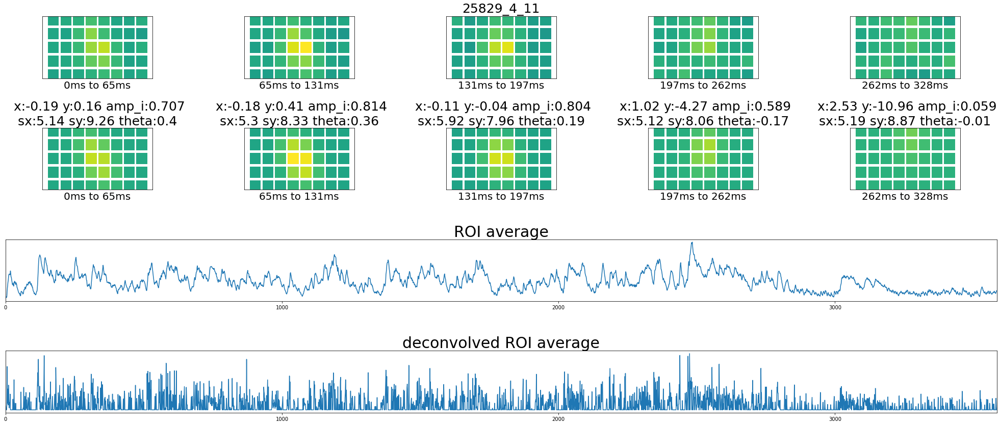

In [9]:
key = {'animal_id':25829,'session':4,'scan_idx':11}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 10 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This u

TRYING AGAIN ECOS


/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 12 times so far.

  warnings.warn(msg, UserWarning)


syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


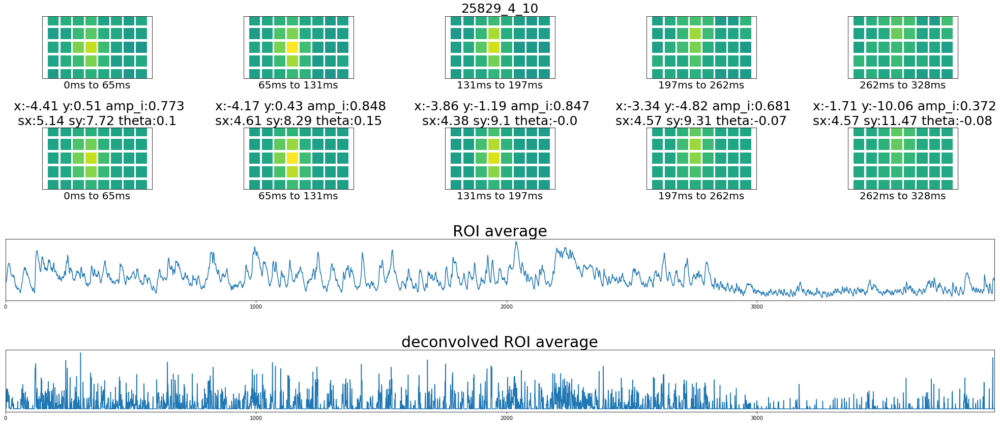

In [8]:
key = {'animal_id':25829,'session':4,'scan_idx':10}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 8 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


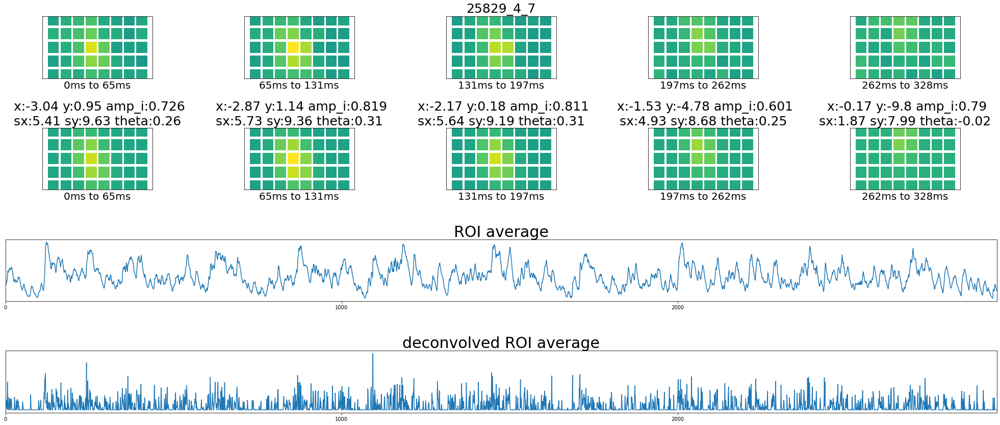

In [5]:
key = {'animal_id':25829,'session':4,'scan_idx':7}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan
PROBLEM STATUS:optimal


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 6 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


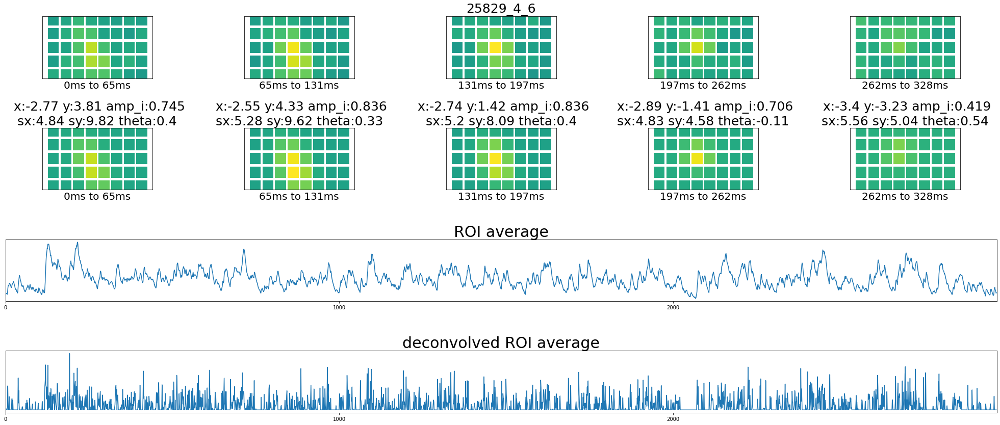

In [4]:
key = {'animal_id':25829,'session':4,'scan_idx':6}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

TRYING AGAIN ECOS


/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 5 times so far.

  warnings.warn(msg, UserWarning)


syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


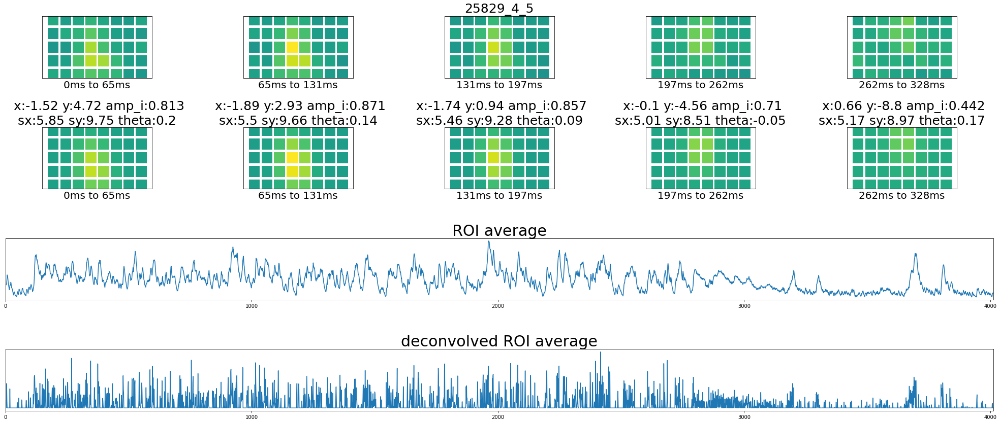

In [3]:
key = {'animal_id':25829,'session':4,'scan_idx':5}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


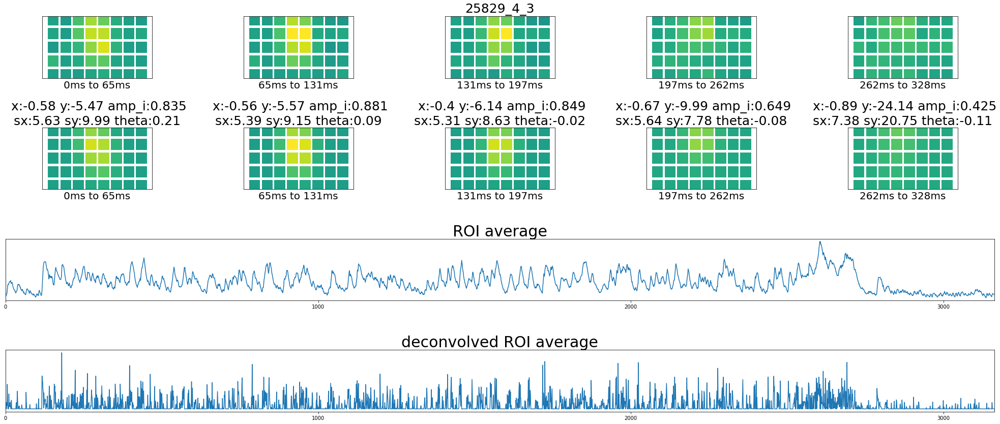

In [2]:
key = {'animal_id':25829,'session':4,'scan_idx':3}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.05]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 8 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


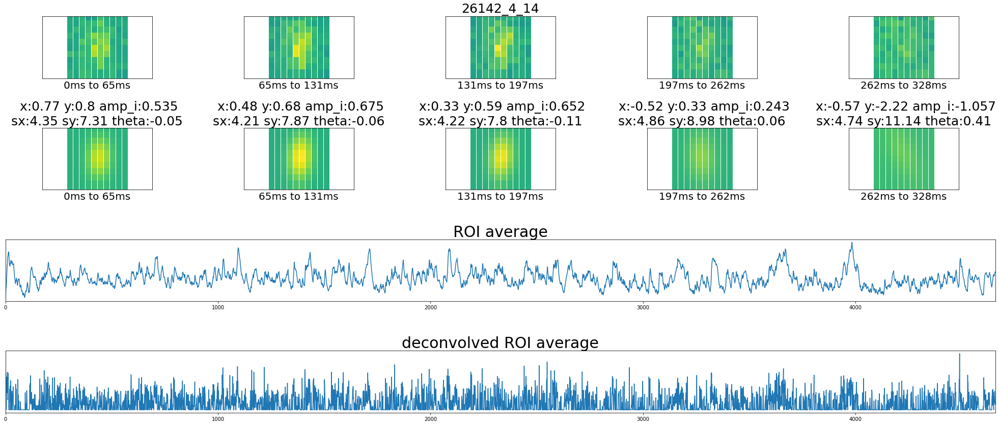

In [6]:
key = {'animal_id':26142,'session':4,'scan_idx':14}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 6 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


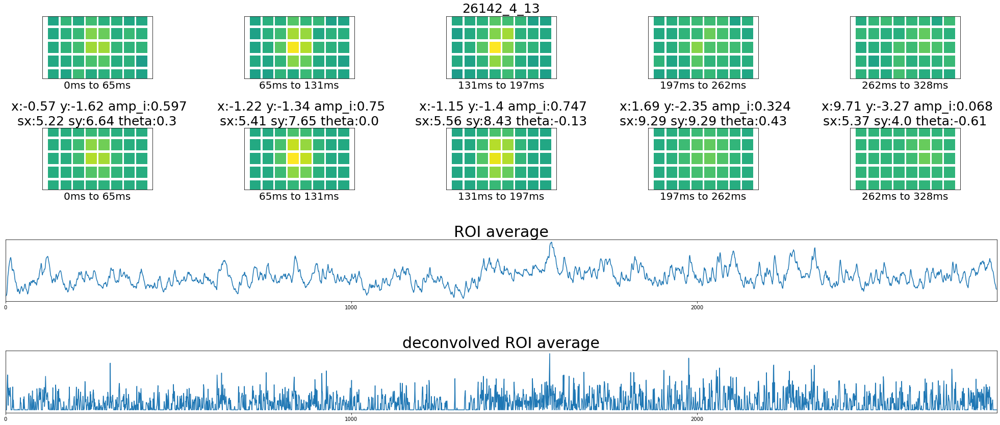

In [5]:
key = {'animal_id':26142,'session':4,'scan_idx':13}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 4 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


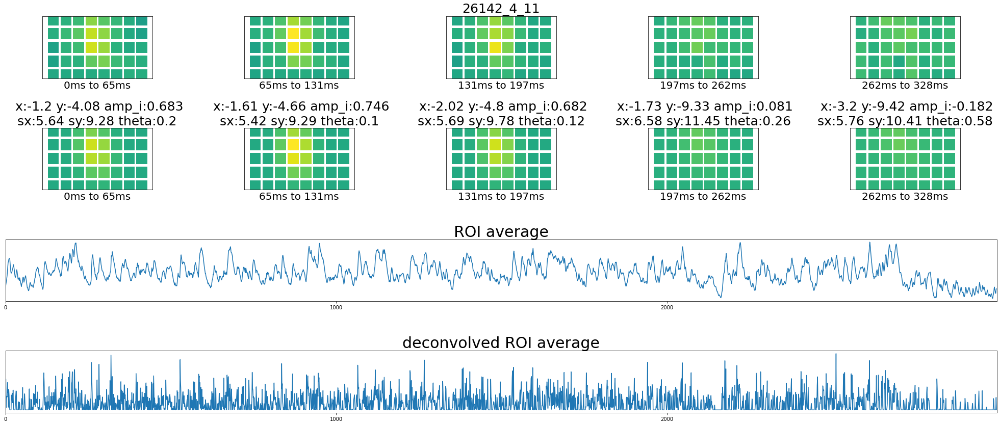

In [4]:
key = {'animal_id':26142,'session':4,'scan_idx':11}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

TRYING AGAIN ECOS


/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3 times so far.

  warnings.warn(msg, UserWarning)


syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


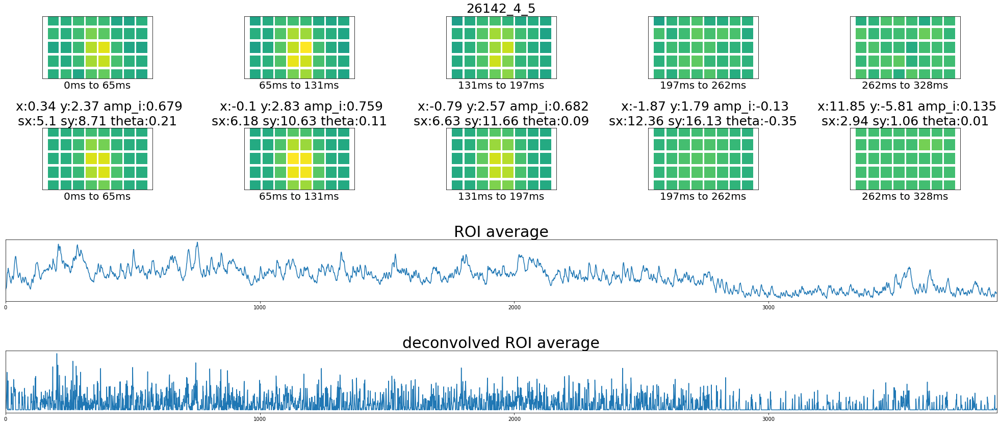

In [3]:
key = {'animal_id':26142,'session':4,'scan_idx':5}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 14 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This u

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


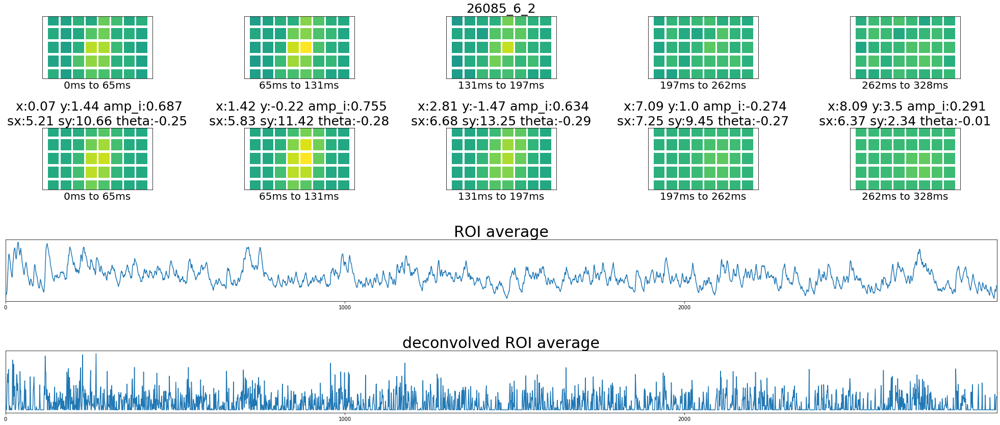

In [9]:
key = {'animal_id':26085,'session':6,'scan_idx':2}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 12 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This u

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


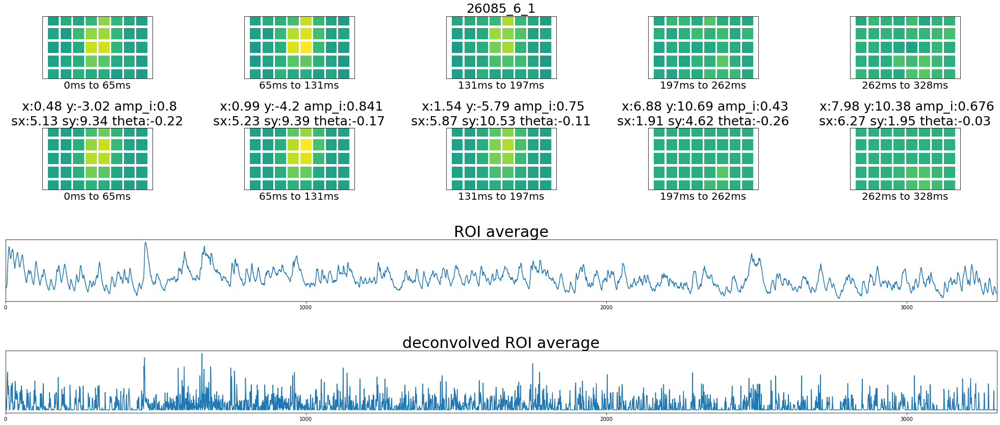

In [8]:
key = {'animal_id':26085,'session':6,'scan_idx':1}
plot_dotmap(key)

populating upstream
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 10 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This u

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


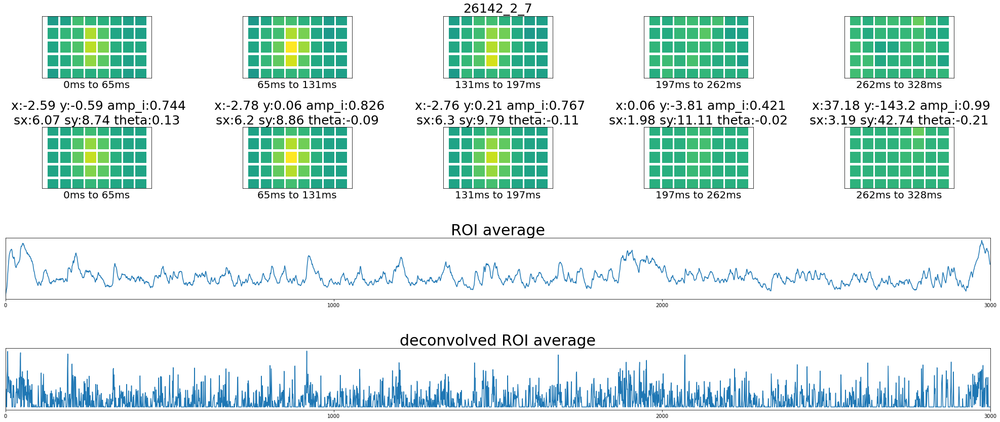

In [7]:
key = {'animal_id':26142,'session':2,'scan_idx':7}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 8 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


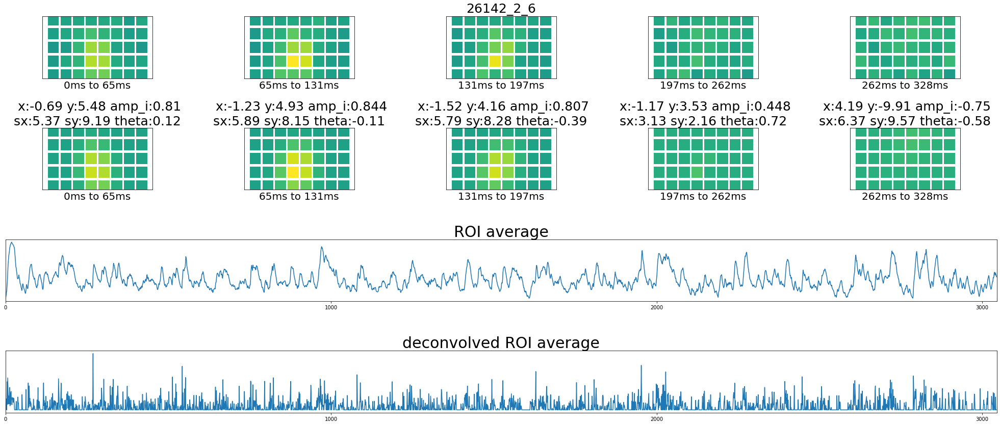

In [5]:
key = {'animal_id':26142,'session':2,'scan_idx':6}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 6 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


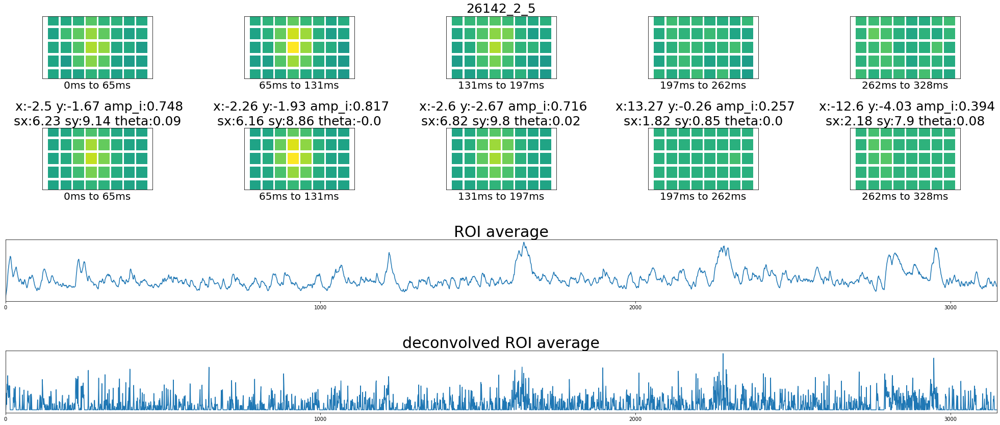

In [4]:
key = {'animal_id':26142,'session':2,'scan_idx':5}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 4 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


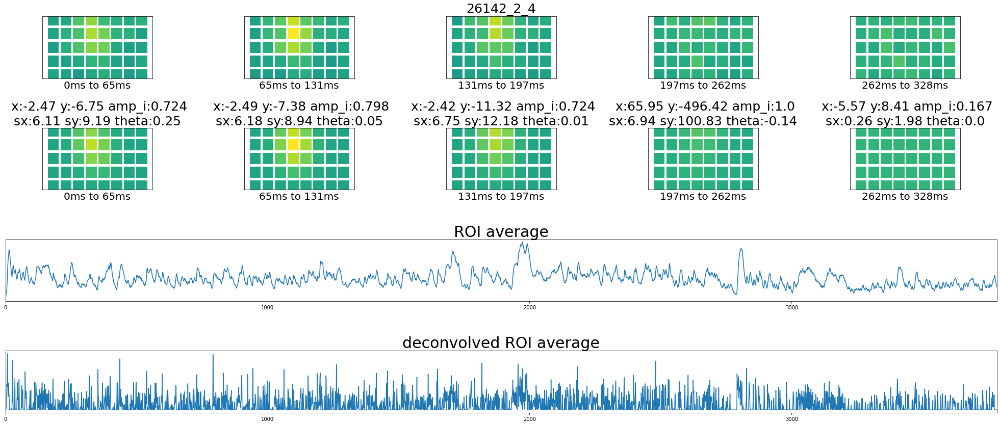

In [3]:
key = {'animal_id':26142,'session':2,'scan_idx':4}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

TRYING AGAIN ECOS


/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3 times so far.

  warnings.warn(msg, UserWarning)


syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


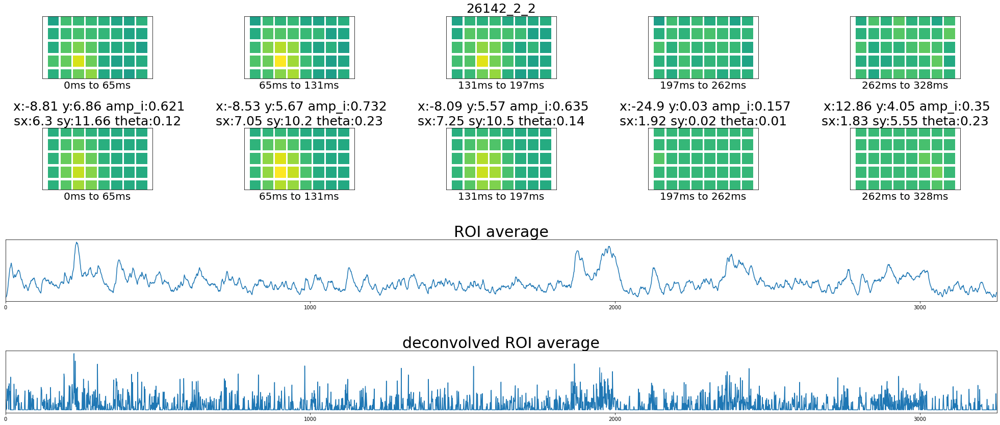

In [2]:
key = {'animal_id':26142,'session':2,'scan_idx':2}
plot_dotmap(key)

In [3]:
key = {'animal_id':26140,'session':5,'scan_idx':6}
plot_dotmap(key)

populating upstream
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 4 times so far.

  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This us

TRYING AGAIN ECOS


/usr/local/lib/python3.6/dist-packages/cvxpy/expressions/expression.py:556: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 6 times so far.

  warnings.warn(msg, UserWarning)


syncing trace


DataJointError: fetch1 should only return one tuple. 0 tuples were found

populating upstream
fetching scan
[0.05]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


TRYING AGAIN ECOS
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


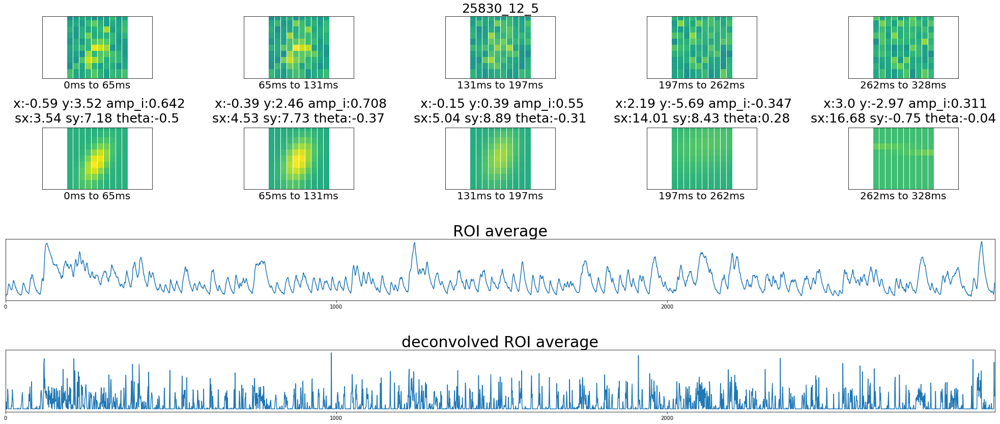

In [3]:
key = {'animal_id':25830,'session':12,'scan_idx':5}
plot_dotmap(key)

populating upstream
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


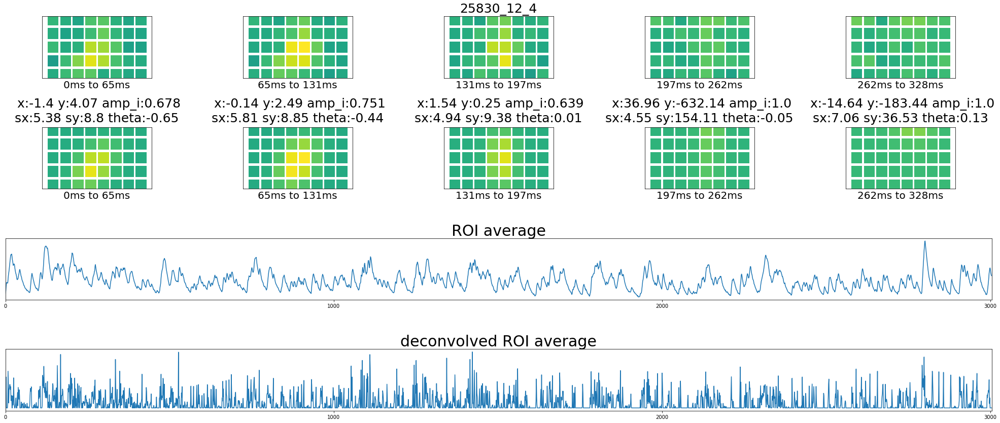

In [3]:
key = {'animal_id':25830,'session':12,'scan_idx':4}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan
PROBLEM STATUS:optimal
syncing trace


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


computing stas
fitting stas
projecting dots to monitor
plotting dots


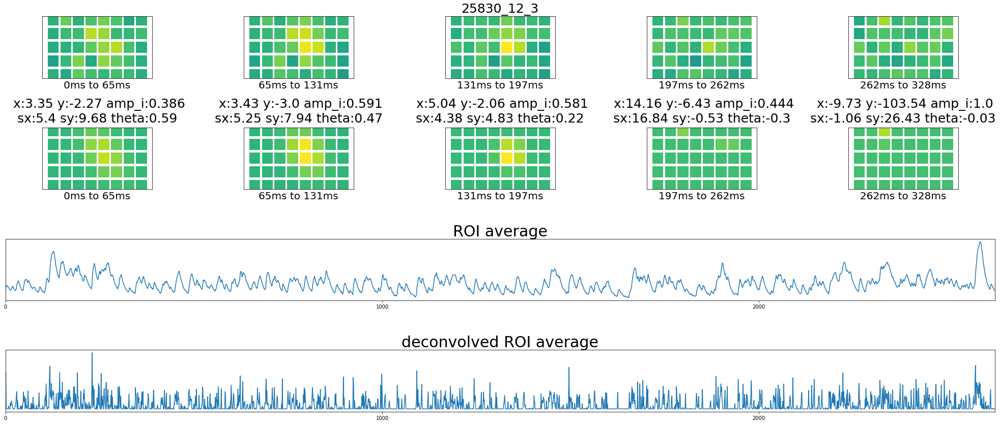

In [4]:
key = {'animal_id':25830,'session':12,'scan_idx':3}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


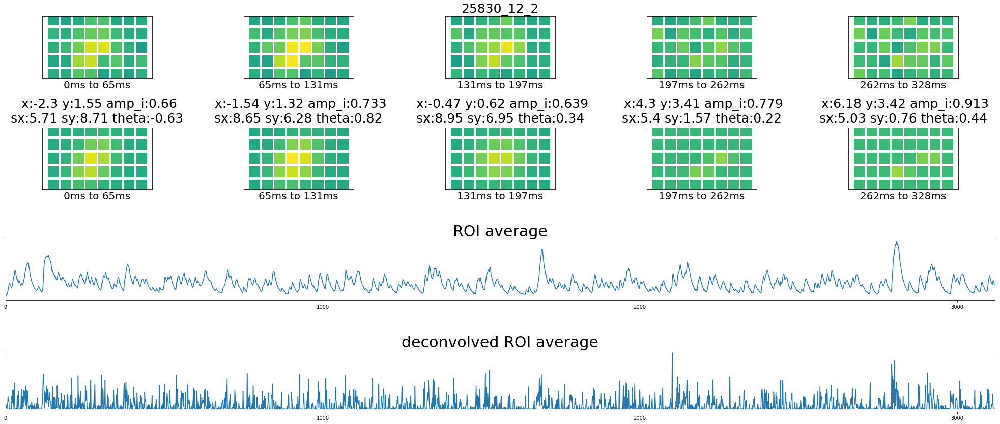

In [3]:
key = {'animal_id':25830,'session':12,'scan_idx':2}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


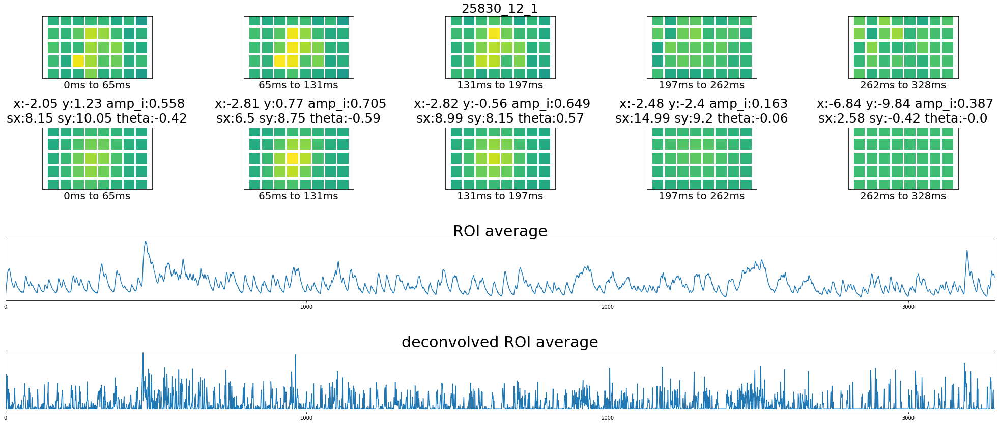

In [2]:
key = {'animal_id':25830,'session':12,'scan_idx':1}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.05]
deconvolving scan
PROBLEM STATUS:optimal


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


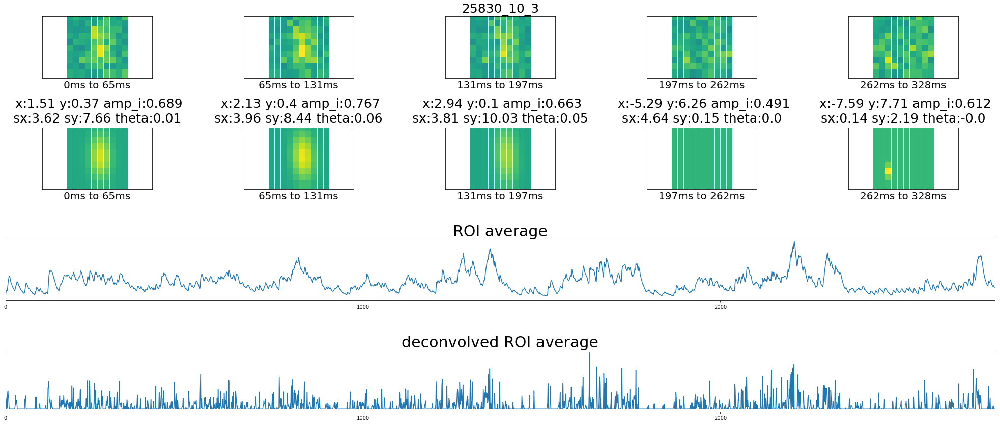

In [13]:
key = {'animal_id':25830,'session':10,'scan_idx':3}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan
PROBLEM STATUS:optimal
syncing trace
computing stas


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


fitting stas
projecting dots to monitor
plotting dots


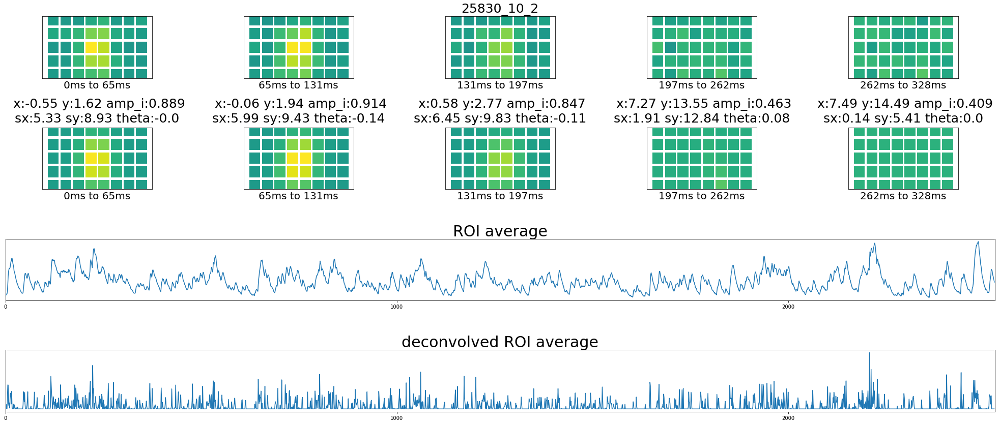

In [12]:
key = {'animal_id':25830,'session':10,'scan_idx':2}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


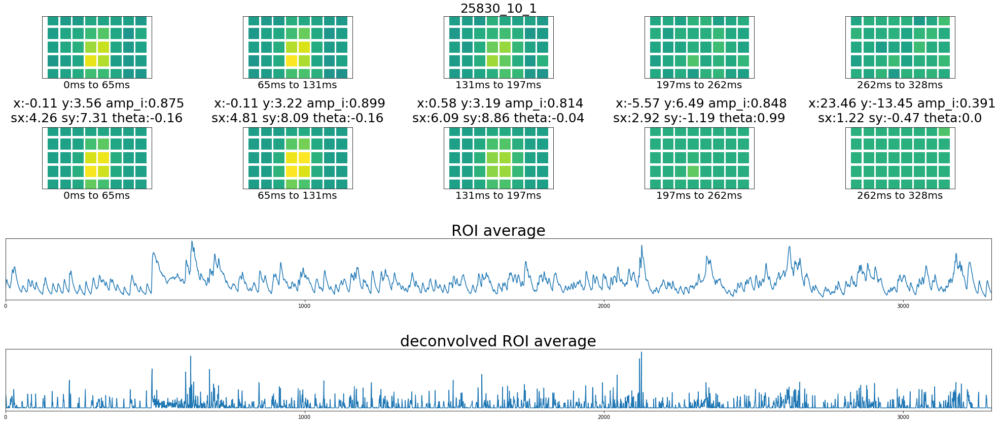

In [10]:
key = {'animal_id':25830,'session':10,'scan_idx':1}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.05]
deconvolving scan
PROBLEM STATUS:optimal
syncing trace
computing stas


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


fitting stas
projecting dots to monitor
plotting dots


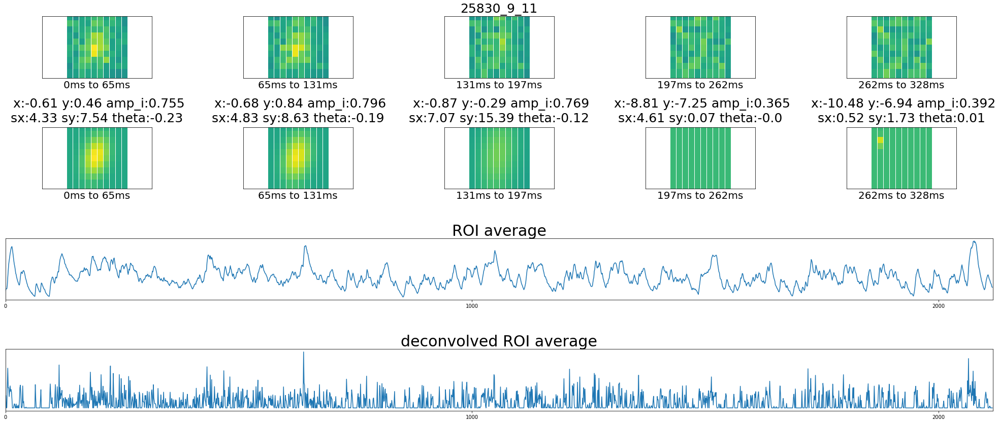

In [9]:
key = {'animal_id':25830,'session':9,'scan_idx':11}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan
PROBLEM STATUS:optimal
syncing trace
computing stas


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


fitting stas
projecting dots to monitor
plotting dots


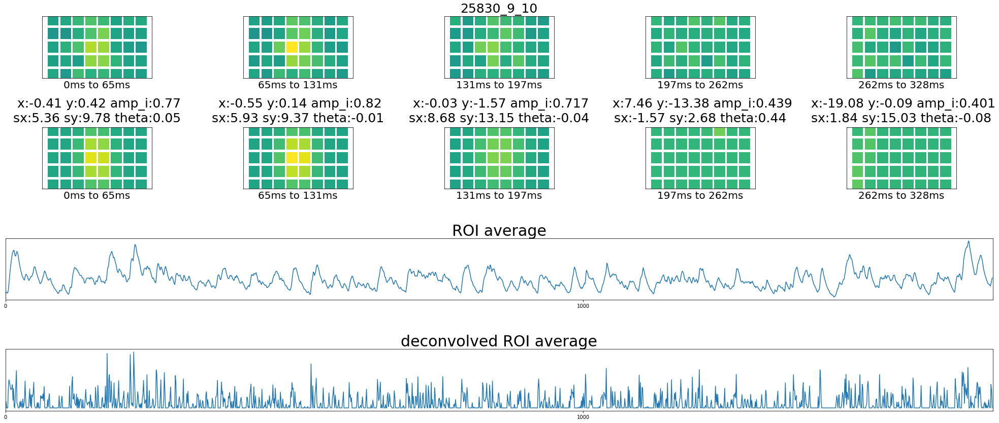

In [8]:
key = {'animal_id':25830,'session':9,'scan_idx':10}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan
PROBLEM STATUS:optimal
syncing trace
computing stas


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


fitting stas
projecting dots to monitor
plotting dots


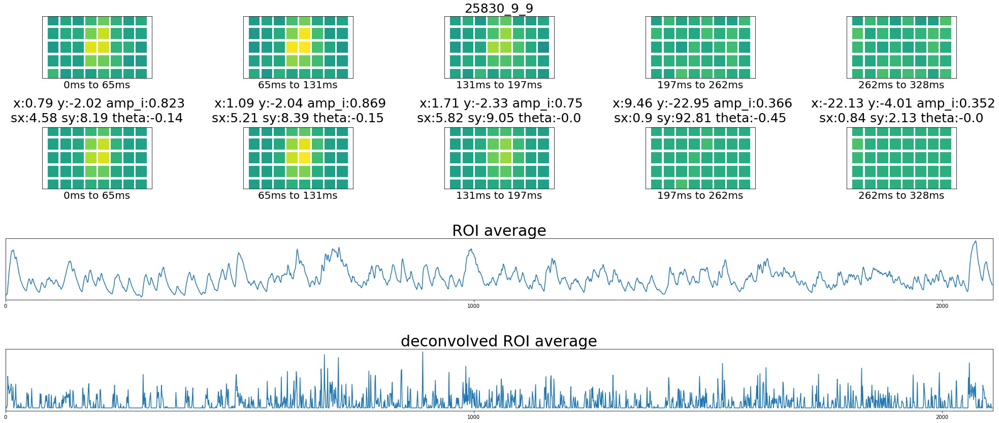

In [7]:
key = {'animal_id':25830,'session':9,'scan_idx':9}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.05]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


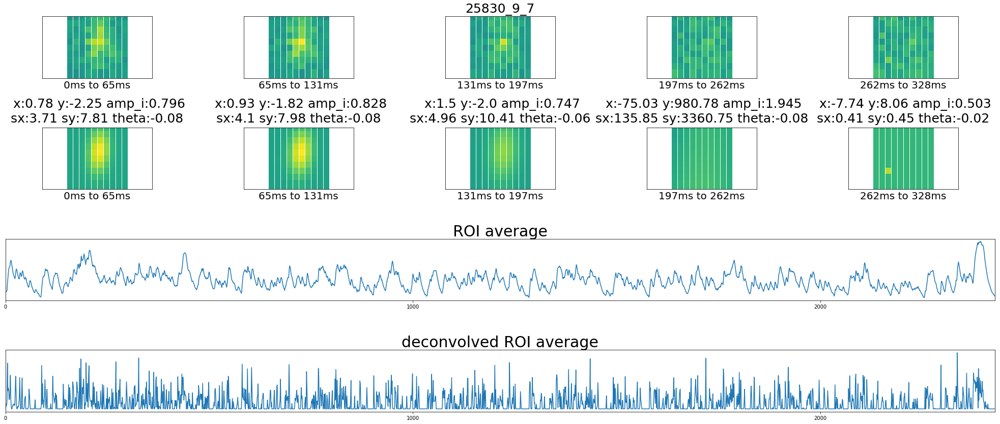

In [5]:
key = {'animal_id':25830,'session':9,'scan_idx':7}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan
PROBLEM STATUS:optimal
syncing trace
computing stas


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


fitting stas
projecting dots to monitor
plotting dots


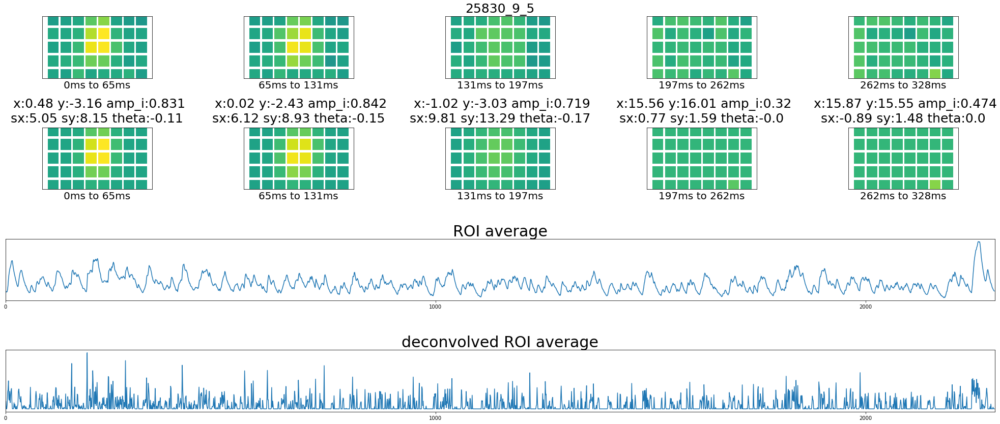

In [4]:
key = {'animal_id':25830,'session':9,'scan_idx':5}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


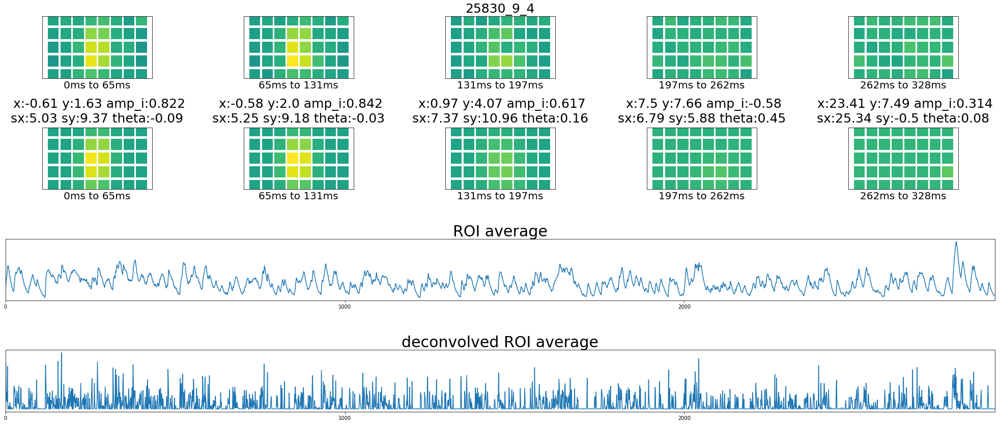

In [3]:
key = {'animal_id':25830,'session':9,'scan_idx':4}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


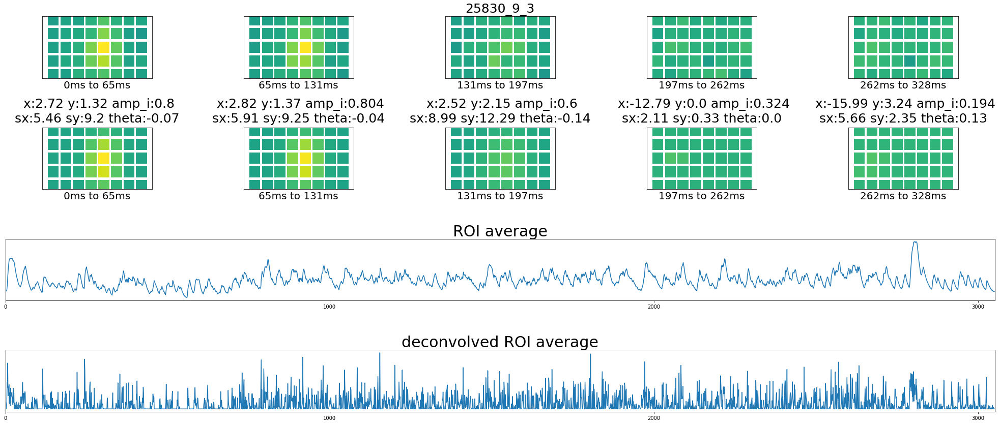

In [2]:
key = {'animal_id':25830,'session':9,'scan_idx':3}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.05]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


TRYING AGAIN ECOS
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


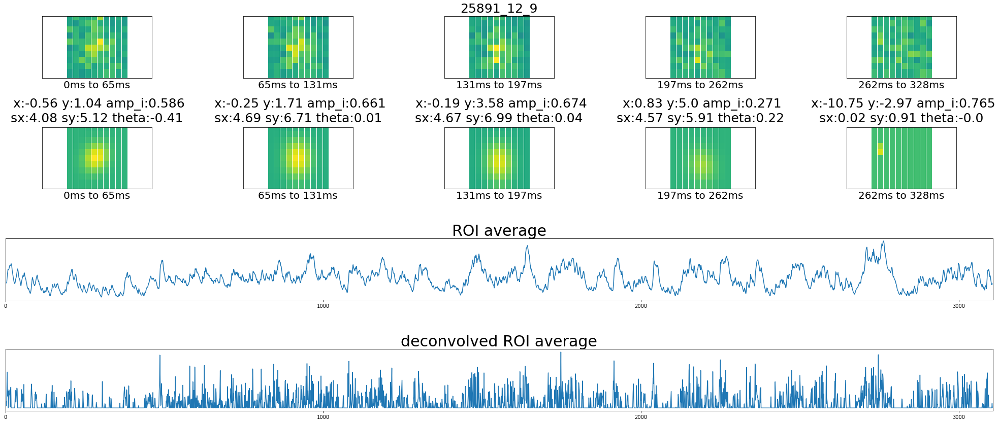

In [2]:
key = {'animal_id':25891,'session':12,'scan_idx':9}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


TRYING AGAIN ECOS
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


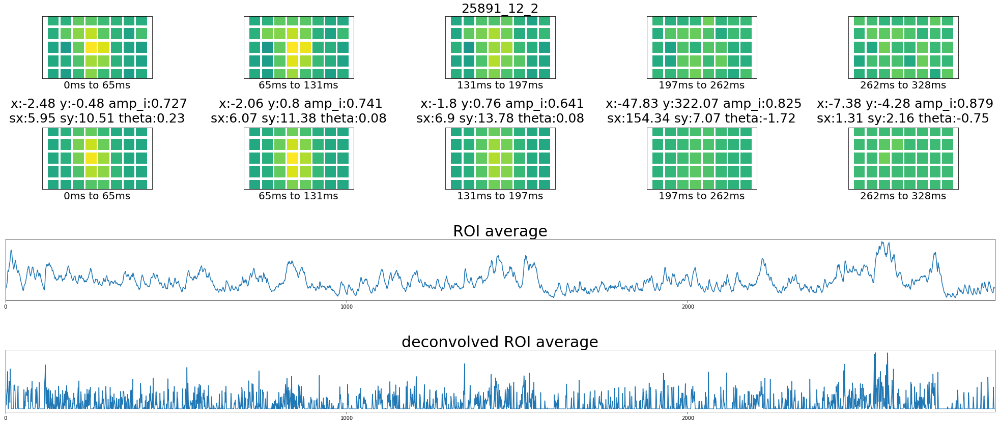

In [5]:
key = {'animal_id':25891,'session':12,'scan_idx':2}
plot_dotmap(key)

populating upstream
Reading header...
fetching scan
[0.1]
deconvolving scan


/usr/local/lib/python3.6/dist-packages/caiman/source_extraction/cnmf/deconvolution.py:1001: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g = np.linalg.lstsq(A, xc[lags + 1:])[0]


PROBLEM STATUS:optimal
syncing trace
computing stas
fitting stas
projecting dots to monitor
plotting dots


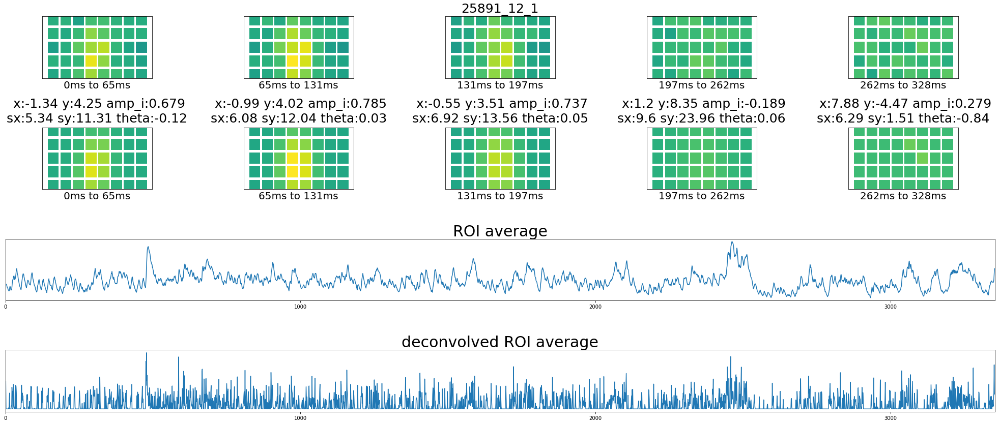

In [4]:
key = {'animal_id':25891,'session':12,'scan_idx':1}
plot_dotmap(key)

In [ ]:
stimulus.Sync().populate(key)